In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [31]:
offences_nb = pd.read_csv('NC_By_Year_And_County_Offences_Counts.csv')
census_nb = pd.read_csv('NC_Census_By_County_Population_and_Income.csv')

In [12]:
# offences_nb.head()

In [14]:
# census_nb.head()

In [15]:
# census_nb.columns

In [32]:
offences_nb.columns

Index(['Year of Sentence', 'County', 'AMERICAN INDIAN/ALASKAN NATIVE',
       'ASIAN/ASIAN AMERICAN', 'BLACK/AFRICAN AMERICAN',
       'HAWAIIAN/PACIFIC ISLANDER', 'OTHER', 'WHITE'],
      dtype='object')

In [33]:
# Rename the columns of df_crimes for consistency
offences_nb = offences_nb.rename(columns={
    'WHITE': 'White Crimes Count',
    'BLACK/AFRICAN AMERICAN': 'Black or African American Crimes Count',
    'AMERICAN INDIAN/ALASKAN NATIVE': 'American Indian and Alaska Native Crimes Count',
    'HAWAIIAN/PACIFIC ISLANDER': 'Pacific Islander Crimes Count',
    'ASIAN/ASIAN AMERICAN': 'Asian Crimes Count',
    'OTHER': 'Other Crimes Count'
})

merged_df = pd.merge(census_nb, offences_nb, left_on=['Year', 'County'], right_on=['Year of Sentence', 'County'])

In [34]:
merged_df.head()

,County,Total Population,White Population,Black or African American Population,American Indian and Alaska Native Population,Asian Population,Male Population,Female Population,Hispanic or Latino Population,Median Household Income (Overall),...,Speak Asian and Pacific Island Languages at Home (Population 5 years and over),Speak Other Languages at Home (Population 5 years and over),Year,Year of Sentence,American Indian and Alaska Native Crimes Count,Asian Crimes Count,Black or African American Crimes Count,Pacific Islander Crimes Count,Other Crimes Count,White Crimes Count
0,"Alamance County, North Carolina",144769.0,102264.0,26038.0,417.0,1770.0,69666.0,75103.0,99010.0,44172.0,...,0.0,93.0,2009,2009,13,10,1372,0,124,1295
1,"Alexander County, North Carolina",36278.0,32327.0,2039.0,144.0,415.0,17983.0,18295.0,32036.0,41520.0,...,0.0,0.0,2009,2009,0,1,76,0,9,290
2,"Alleghany County, North Carolina",10905.0,9256.0,77.0,9.0,31.0,5445.0,5460.0,8957.0,32541.0,...,0.0,15.0,2009,2009,4,0,10,0,16,126
3,"Anson County, North Carolina",25243.0,12270.0,12093.0,161.0,245.0,13017.0,12226.0,12244.0,33706.0,...,0.0,0.0,2009,2009,2,0,288,0,6,69
4,"Ashe County, North Carolina",25467.0,24304.0,115.0,168.0,117.0,12492.0,12975.0,24105.0,35312.0,...,0.0,0.0,2009,2009,1,0,4,0,13,268


In [35]:
merged_df.columns

Index(['County', 'Total Population', 'White Population',
       'Black or African American Population',
       'American Indian and Alaska Native Population', 'Asian Population',
       'Male Population', 'Female Population', 'Hispanic or Latino Population',
       'Median Household Income (Overall)',
       'Median Household Income (White Alone)',
       'Median Household Income (Black or African American Alone)',
       'Median Household Income (American Indian and Alaska Native Alone)',
       'Median Household Income (Asian Alone)',
       'Median Household Income (Native Hawaiian and Other Pacific Islander Alone)',
       'Median Household Income (Some Other Race Alone)',
       'Median Household Income (Two or More Races)',
       'Median Household Income (Hispanic or Latino)',
       'Speak Only English at Home (Population 5 years and over)',
       'Speak Spanish at Home (Population 5 years and over)',
       'Speak Other Indo-European Languages at Home (Population 5 years and 

In [36]:
# Normalizing crime rates as crimes per 100,000 people
merged_df['Normalized White Crime Rate'] = (merged_df['White Crimes Count'] / merged_df['White Population']) * 100000
merged_df['Normalized Black or African American Crime Rate'] = (merged_df['Black or African American Crimes Count'] / merged_df['Black or African American Population']) * 100000
merged_df['Normalized Asian Crime Rate'] = (merged_df['Asian Crimes Count'] / merged_df['Asian Population']) * 100000
merged_df['Normalized American Indian and Alaska Native Crime Rate'] = (merged_df['American Indian and Alaska Native Crimes Count'] / merged_df['American Indian and Alaska Native Population']) * 100000
merged_df['Normalized Pacific Islander Crime Rate'] = (merged_df['Pacific Islander Crimes Count'] / merged_df['Median Household Income (Native Hawaiian and Other Pacific Islander Alone)']) * 100000
merged_df['Normalized Other Crime Rate'] = (merged_df['Other Crimes Count'] / merged_df['Median Household Income (Some Other Race Alone)']) * 100000

In [37]:
merged_df.head()

,County,Total Population,White Population,Black or African American Population,American Indian and Alaska Native Population,Asian Population,Male Population,Female Population,Hispanic or Latino Population,Median Household Income (Overall),...,Black or African American Crimes Count,Pacific Islander Crimes Count,Other Crimes Count,White Crimes Count,Normalized White Crime Rate,Normalized Black or African American Crime Rate,Normalized Asian Crime Rate,Normalized American Indian and Alaska Native Crime Rate,Normalized Pacific Islander Crime Rate,Normalized Other Crime Rate
0,"Alamance County, North Carolina",144769.0,102264.0,26038.0,417.0,1770.0,69666.0,75103.0,99010.0,44172.0,...,1372,0,124,1295,1266.330282,5269.221906,564.971751,3117.505995,0.0,393.326144
1,"Alexander County, North Carolina",36278.0,32327.0,2039.0,144.0,415.0,17983.0,18295.0,32036.0,41520.0,...,76,0,9,290,897.082934,3727.317312,240.963855,0.000000,0.0,46.101834
2,"Alleghany County, North Carolina",10905.0,9256.0,77.0,9.0,31.0,5445.0,5460.0,8957.0,32541.0,...,10,0,16,126,1361.279170,12987.012987,0.000000,44444.444444,NaN,30.454147
3,"Anson County, North Carolina",25243.0,12270.0,12093.0,161.0,245.0,13017.0,12226.0,12244.0,33706.0,...,288,0,6,69,562.347188,2381.543041,0.000000,1242.236025,NaN,NaN
4,"Ashe County, North Carolina",25467.0,24304.0,115.0,168.0,117.0,12492.0,12975.0,24105.0,35312.0,...,4,0,13,268,1102.699144,3478.260870,0.000000,595.238095,NaN,43.046358


/var/folders/h_/kfny25bn1zzfnh8sd3dsvypw0000gn/T/ipykernel_10068/1495623183.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_data = merged_df.groupby('Year').mean()  # Taking average if there's data for multiple counties


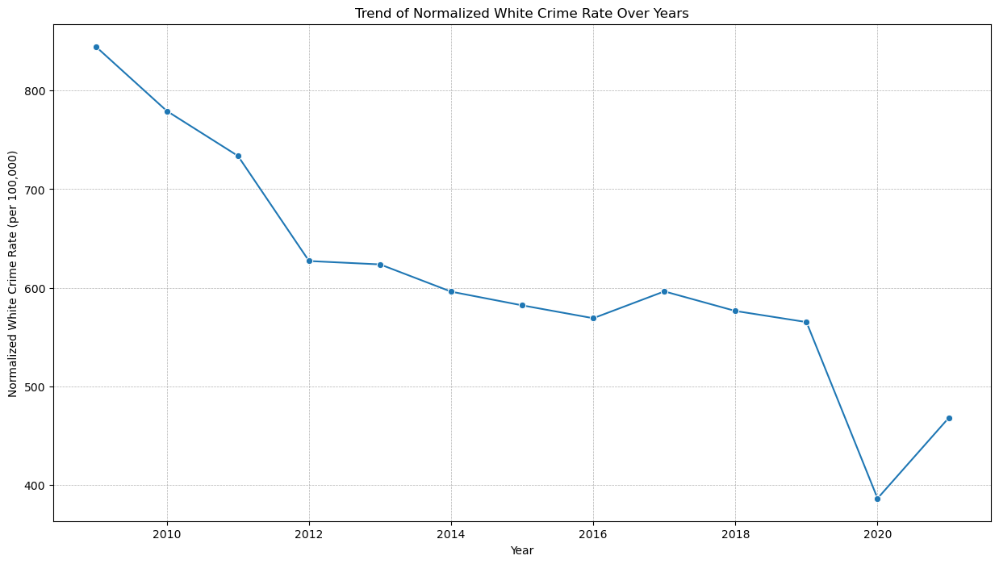

In [38]:
# Group data by Year for a specific racial group (e.g., White)
grouped_data = merged_df.groupby('Year').mean()  # Taking average if there's data for multiple counties

plt.figure(figsize=(15, 8))
sns.lineplot(data=grouped_data, x=grouped_data.index, y='Normalized White Crime Rate', marker='o')
plt.ylabel("Normalized White Crime Rate (per 100,000)")
plt.title("Trend of Normalized White Crime Rate Over Years")
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()

In [39]:
# List of racial groups and their corresponding normalized crime rates columns
racial_groups = ['White', 'Black or African American', 'Asian', 'American Indian and Alaska Native', 'Pacific Islander', 'Other']

normalized_columns = ['Normalized White Crime Rate', 'Normalized Black or African American Crime Rate', 'Normalized Asian Crime Rate', 'Normalized American Indian and Alaska Native Crime Rate', 'Normalized Pacific Islander Crime Rate', 'Normalized Other Crime Rate']

# Number of unique counties
num_counties = merged_df['County'].nunique()
counties = merged_df['County'].unique()

# Set up the subplots
fig, axes = plt.subplots(nrows=num_counties, figsize=(15, 6*num_counties), sharex=True)

# Loop through each county
for i, county in enumerate(counties):
    county_data = merged_df[merged_df['County'] == county]
    for j, col in enumerate(normalized_columns):
        sns.lineplot(data=county_data, x='Year', y=col, ax=axes[i], label=racial_groups[j])
    axes[i].set_ylabel('Normalized Crime Rate (per 100,000)')
    axes[i].set_title(f'Crime Rate Trends in {county}')
    axes[i].legend(loc='upper left')
    axes[i].grid(True, which='both', linestyle='--', linewidth=0.5)

plt.xlabel('Year')
plt.tight_layout()
plt.show()

In [41]:
merged_df.to_csv('NC_By_County_Normalized_Crime_Rate.csv')

In [42]:
merged_df['County'] = merged_df['County'].str.replace('County, Nebraska', '')

In [43]:
merged_df.head()

,County,Total Population,White Population,Black or African American Population,American Indian and Alaska Native Population,Asian Population,Male Population,Female Population,Hispanic or Latino Population,Median Household Income (Overall),...,Black or African American Crimes Count,Pacific Islander Crimes Count,Other Crimes Count,White Crimes Count,Normalized White Crime Rate,Normalized Black or African American Crime Rate,Normalized Asian Crime Rate,Normalized American Indian and Alaska Native Crime Rate,Normalized Pacific Islander Crime Rate,Normalized Other Crime Rate
0,"Alamance County, North Carolina",144769.0,102264.0,26038.0,417.0,1770.0,69666.0,75103.0,99010.0,44172.0,...,1372,0,124,1295,1266.330282,5269.221906,564.971751,3117.505995,0.0,393.326144
1,"Alexander County, North Carolina",36278.0,32327.0,2039.0,144.0,415.0,17983.0,18295.0,32036.0,41520.0,...,76,0,9,290,897.082934,3727.317312,240.963855,0.000000,0.0,46.101834
2,"Alleghany County, North Carolina",10905.0,9256.0,77.0,9.0,31.0,5445.0,5460.0,8957.0,32541.0,...,10,0,16,126,1361.279170,12987.012987,0.000000,44444.444444,NaN,30.454147
3,"Anson County, North Carolina",25243.0,12270.0,12093.0,161.0,245.0,13017.0,12226.0,12244.0,33706.0,...,288,0,6,69,562.347188,2381.543041,0.000000,1242.236025,NaN,NaN
4,"Ashe County, North Carolina",25467.0,24304.0,115.0,168.0,117.0,12492.0,12975.0,24105.0,35312.0,...,4,0,13,268,1102.699144,3478.260870,0.000000,595.238095,NaN,43.046358
